In [93]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# Below are all the installed Packages for the miniproject:
import numpy as np 
import pandas as pd 
import os
import glob
import random
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, TensorDataset
from torchvision import datasets, transforms, models
import torchmetrics
from PIL import Image
import pytorch_lightning as pl
from argparse import Namespace
from torchvision.datasets import ImageFolder
from sklearn.metrics import confusion_matrix
from pytorch_lightning.loggers import WandbLogger
import wandb

# Exploration of dataset through code
In this section we will explore the dataset through code, specifically the training dataset, its distributions and what will be used.

In [94]:

# We specify the size of the figures here.
plt.rcParams['figure.figsize'] = (10, 6)

# Path to the extracted training dataset directory:
DATASET_PATH = "/kaggle/input/fruit-and-vegetable-image-recognition/train"


In [95]:
# Search for all image files in the directory
image_paths = glob.glob(os.path.join(DATASET_PATH, "*", "*.*"))

total_images = len(image_paths)
print(f"Total number of images in the dataset: {total_images}")


Total number of images in the dataset: 3115


Number of classes: 36
Class 'apple': 68 images
Class 'banana': 75 images
Class 'beetroot': 88 images
Class 'bell pepper': 90 images
Class 'cabbage': 92 images
Class 'capsicum': 89 images
Class 'carrot': 82 images
Class 'cauliflower': 79 images
Class 'chilli pepper': 87 images
Class 'corn': 87 images
Class 'cucumber': 94 images
Class 'eggplant': 84 images
Class 'garlic': 92 images
Class 'ginger': 68 images
Class 'grapes': 100 images
Class 'jalepeno': 88 images
Class 'kiwi': 88 images
Class 'lemon': 82 images
Class 'lettuce': 97 images
Class 'mango': 86 images
Class 'onion': 94 images
Class 'orange': 69 images
Class 'paprika': 83 images
Class 'pear': 89 images
Class 'peas': 100 images
Class 'pineapple': 99 images
Class 'pomegranate': 79 images
Class 'potato': 77 images
Class 'raddish': 81 images
Class 'soy beans': 97 images
Class 'spinach': 97 images
Class 'sweetcorn': 91 images
Class 'sweetpotato': 69 images
Class 'tomato': 92 images
Class 'turnip': 98 images
Class 'watermelon': 84 imag

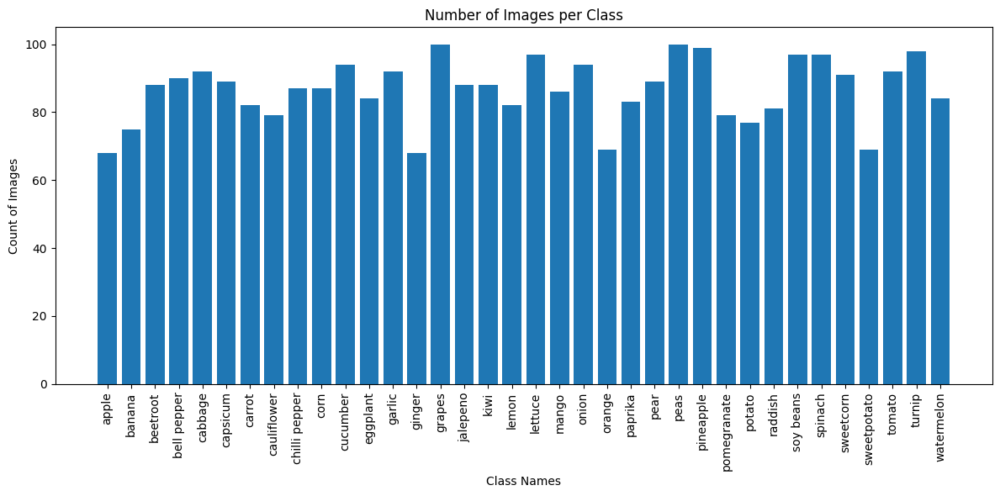

In [96]:
# List all subdirectories (each subdirectory = one class)
class_names = sorted([
    d for d in os.listdir(DATASET_PATH) 
    if os.path.isdir(os.path.join(DATASET_PATH, d))
])

num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

# Dictionary for number of files per class
class_counts = {}

for class_name in class_names:
    class_dir = os.path.join(DATASET_PATH, class_name)
    class_counts[class_name] = len(os.listdir(class_dir))

# Print class names and counts
for cls, cnt in class_counts.items():
    print(f"Class '{cls}': {cnt} images")

# Plot histogram of the class distribution
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values())
plt.xticks(rotation=90)
plt.title("Number of Images per Class")
plt.xlabel("Class Names")
plt.ylabel("Count of Images")
plt.tight_layout()
plt.show()


We now know our distribution of images per class for the training dataset. We then plot roughly 4 figures for each class to show them off.

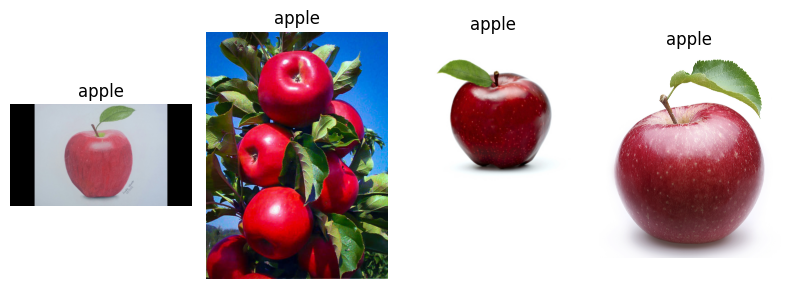

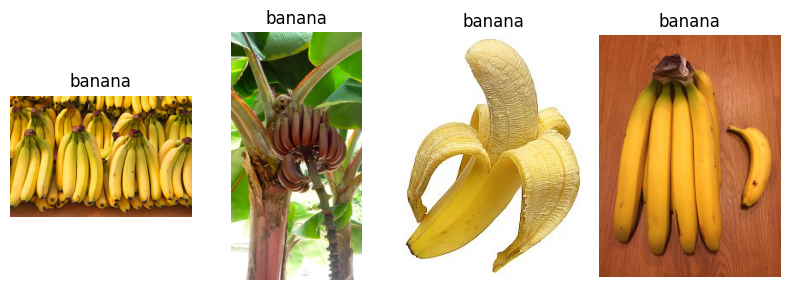

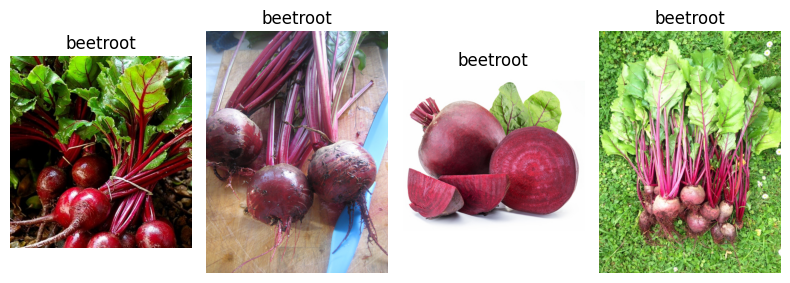

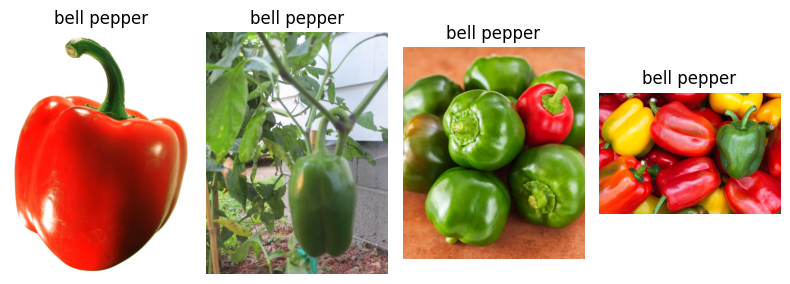

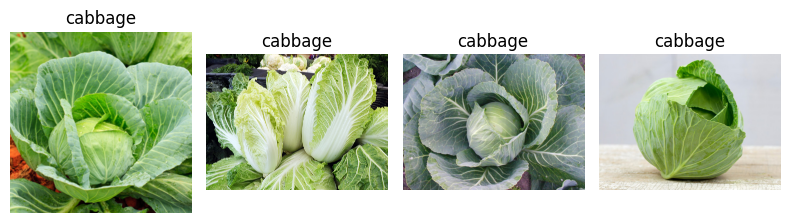

...

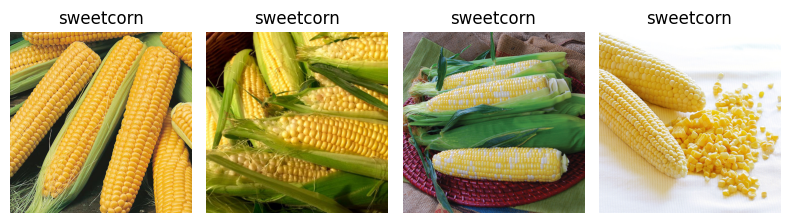

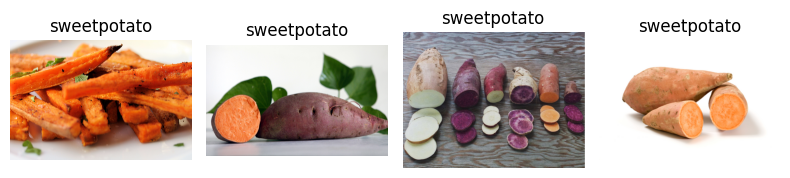

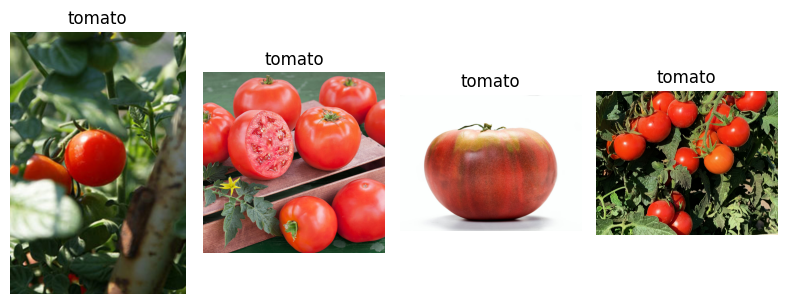

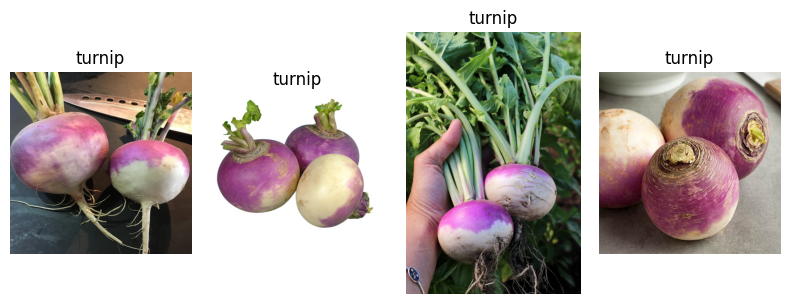

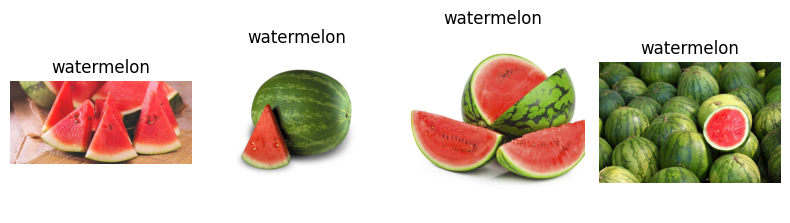

In [97]:
for class_name in class_names:
    class_dir = os.path.join(DATASET_PATH, class_name)
    all_images = os.listdir(class_dir)
    
    # If there are fewer than 4 images we just sample them all
    n_to_show = min(4, len(all_images))
    sample_images = random.sample(all_images, n_to_show)
    
    # We make a figure per class
    plt.figure(figsize=(8, 3))
    for i, img_name in enumerate(sample_images):
        img_path = os.path.join(class_dir, img_name)
        image = plt.imread(img_path)
        
        plt.subplot(1, n_to_show, i+1)
        plt.imshow(image)
        plt.title(class_name)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Remove the break below if you want to see images for ALL classes.
    # Otherwise, this break will just show the first class for brevity.
    #break


Now we have explored the dataset and it is time to train a DL model
# Convolutional Neural network for fruits and vegestable classification
Below we will develop the ML model.

In [98]:

# Our data direction paths
TRAIN_DIR = "/kaggle/input/fruit-and-vegetable-image-recognition/train"
VALID_DIR = "/kaggle/input/fruit-and-vegetable-image-recognition/validation"
TEST_DIR = "/kaggle/input/fruit-and-vegetable-image-recognition/test"


IMG_SIZE = (150, 150)  # We'll resize images to 150x150
BATCH_SIZE = 32

#We determine our device and print out what device we are using for bugfixing.
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
if torch.cuda.is_available():
    print("using {}".format(torch.cuda.get_device_name(0)))
else:
    print("using CPU")

print(torch.__version__)  # Should be >= 2.0
print(pl.__version__)

using Tesla P100-PCIE-16GB
2.5.1+cu121
2.5.0.post0


In [99]:
# Hyperparameters for the Run. This is where the variables are instantiated before runs.
hparams = Namespace(
    # Data
    entity="25DLAAU",
    exp_name='mp_age_classifier',  # Unique name for model and logs
    image_size=150,  # Images size for input to model
    image_channels=3,  # 3 for RGB, 1 for grayscale images
    # Model
    num_conv_blocks=2,  # Number of Conv->Pool blocks
    filters=32,  # Number of connections in the first block to next layer
    kernel_size=3,  # Kernel size for convolutional layers
    dropout_rate=0.0,  # Dropout rate
    num_classes=36,  # Number of output classes
    # Training
    wandb_project='Miniproject',
    group="learning_rate_experiment",
    accelerator='gpu',  # Use 'gpu' for GPU training, 'cpu' for CPU
    devices=1,  # Number of GPUs or CPUs
    max_epochs=3,  # Number of epochs
    learning_rate=1e-3,  # Learning rate (default, may be overridden)
    batch_size=8,  # Batch size
    n_workers=4,  # Number of data loader workers
    ReduceData = False #removes class if true
)

In [100]:
# Defines the CNN model
class CNNModel(nn.Module):
    def __init__(self, num_conv_blocks=2, filters=32, kernel_size=3, dropout_rate=0.0, num_classes=10, in_channels = 3):
        super(CNNModel, self).__init__()
        self.layers = nn.ModuleList()

        #This is where the inner layers are instantiated for the CNN.
        for i in range(num_conv_blocks):
            out_channels = filters * (2 ** i)
            self.layers.append(nn.Conv2d(in_channels, out_channels, kernel_size, padding='same'))
            self.layers.append(nn.ReLU())
            self.layers.append(nn.MaxPool2d(2))
            self.layers.append(nn.Dropout(dropout_rate))
            in_channels = out_channels

        #This is the classifier for the CNN. The data is flattened to a compatible format for fc1, 
        #after which is it run through the output layer and softmaxed for probabilities.
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(out_channels * (IMG_SIZE[0] // (2 ** num_conv_blocks)) * (IMG_SIZE[1] // (2 ** num_conv_blocks)), 128)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(128, num_classes)
        self.softmax = nn.Softmax(dim=1)

    #The 
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x


# Wrap the CNNModel in a PyTorch Lightning Module
class LitModel(pl.LightningModule):
    def __init__(self, hparams):
        super().__init__()
        self.save_hyperparameters(hparams)
        
        # Initialize the CNNModel
        self.model = CNNModel(
            num_conv_blocks=hparams.num_conv_blocks,
            filters=hparams.filters,
            kernel_size=hparams.kernel_size,
            dropout_rate=hparams.dropout_rate,
            num_classes=hparams.num_classes,
            in_channels=hparams.image_channels
        ).to(device)
        
        # Loss function
        self.criterion = nn.CrossEntropyLoss()
        
        # Metrics
        self.train_accuracy = torchmetrics.Accuracy(task='multiclass', num_classes=hparams.num_classes)
        self.val_accuracy = torchmetrics.Accuracy(task='multiclass', num_classes=hparams.num_classes)
        self.test_accuracy =torchmetrics.Accuracy(task='multiclass', num_classes=hparams.num_classes)

        self.test_preds = []
        self.test_targets = []
        self.misclassified_table = wandb.Table(columns=["image", "true_label", "pred_label"])
    
    def forward(self, x):
        return self.model(x)

    
    def training_step(self, batch, batch_idx):
        x, y = batch
        x, y = x.to(self.device), y.to(self.device)
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = torch.argmax(logits, dim=1)
        self.train_accuracy.update(preds, y)
        
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log('train_acc', self.train_accuracy, on_step=True, on_epoch=True, prog_bar=True)
        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        x, y = x.to(self.device), y.to(self.device)
        logits = self(x)
        loss = self.criterion(logits, y)
        preds = torch.argmax(logits, dim=1)
        self.val_accuracy.update(preds, y)
        
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log('val_acc', self.val_accuracy, on_step=True, on_epoch=True, prog_bar=True)
    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self.forward(x)
        loss   = self.criterion(logits, y)
        preds  = torch.argmax(logits, dim=1)
        self.test_accuracy.update(preds, y)

        if batch_idx == 0 and not hasattr(self, "misclassified_table"):
            # Create a table with desired columns
            self.misclassified_table = wandb.Table(columns=["image", "true_label", "pred_label"])
        
        # Check which samples are wrong
        wrong_idx = (preds != y).nonzero(as_tuple=True)
        for idx in wrong_idx[0]:
            # Convert the PyTorch tensor (CHW) to a format for wandb.Image (HWC or PIL)
            img_array = x[idx].cpu().numpy().transpose(1, 2, 0)
            
            # Add a row for each misclassified example
            self.misclassified_table.add_data(
                wandb.Image(img_array, caption=f"Pred={preds[idx].item()}, GT={y[idx].item()}"),
                y[idx].item(),
                preds[idx].item()
            )
    
        # Log loss and accuracy to wandB
        self.log('test_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log('test_acc', self.test_accuracy, on_step=True, on_epoch=True, prog_bar=True)
    
        # Store predictions and targets for confusion matrix
        self.test_preds.append(preds)
        self.test_targets.append(y)
        
    #This function runs after the testing where the results of the testing is compiled and presented as a 
    def on_test_epoch_end(self):

        if self.misclassified_table is not None:
            wandb.log({"wrong_predictions": self.misclassified_table})
        # Concatenate all predictions and targets
        preds = torch.cat(self.test_preds)
        targets = torch.cat(self.test_targets)

        # Compute confusion matrix
        num_classes = self.hparams.num_classes
        cm = confusion_matrix(targets.cpu(), preds.cpu(), labels=np.arange(num_classes))

        #Sorting the names according to alphabet and giving them a numberical value for proper CM presentation.
        class_names = [str(i) for i in range(num_classes)] 
        # Log confusion matrix to W&B
        wandb.log({
            "test_confusion_matrix": wandb.plot.confusion_matrix(
                probs=None,
                y_true=targets.cpu().numpy(),
                preds=preds.cpu().numpy(),
                class_names=class_names
            )
        })

        # Log test accuracy for WandB
        test_acc = self.test_accuracy.compute()
        self.log('test_acc_epoch', test_acc)
    
    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hparams.learning_rate)
        return optimizer


# The class below is for removing the sweetcorn data 
The sweetcorn data was found to be troublesome and we could visually not see a difference either

In [101]:
class PartialImageFolder(ImageFolder):
    def find_classes(self, directory):
        classes, class_to_idx = super().find_classes(directory)
        # filter out sweetcorn
        classes = [c for c in classes if c != "sweetcorn"]
        class_to_idx = {c: i for i, c in enumerate(classes)}
        return classes, class_to_idx

The section below is to perform transformations on the data

In [102]:

# Custom loader to handle transparency
def load_rgb_image(path):
    img = Image.open(path)
    
    # Convert Palette images to RGBA first, then to RGB as there's three different formats
    if img.mode == 'P':
        img = img.convert("RGBA").convert("RGB")
    elif img.mode == 'RGBA':
        img = img.convert("RGB")
        #print(f"After conversion: {path}, Mode: {img.mode}")  # Debug print
    
    return img

def build_transforms(img_size=150):
    return transforms.Compose([
        transforms.Lambda(lambda img: img.convert("RGB") if img.mode != "RGB" else img),
        transforms.Resize((img_size, img_size)),
        #transforms.RandomHorizontalFlip(p=0.5),
        #transforms.RandomRotation(degrees=15),
        #transforms.RandomHorizontalFlip(),
        #transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])


# Define transformations
transform = build_transforms()

    # Load datasets (equivalent to image_dataset_from_directory)
if hparams.ReduceData:
    train_ds = PartialImageFolder(TRAIN_DIR, loader=load_rgb_image, transform=transform)
    val_ds   = PartialImageFolder(VAL_DIR,   loader=load_rgb_image, transform=transform)
    test_ds  = PartialImageFolder(TEST_DIR,  loader=load_rgb_image, transform=transform)
else:
    train_ds = datasets.ImageFolder(TRAIN_DIR, transform=transform, loader=load_rgb_image)
    val_ds = datasets.ImageFolder(VALID_DIR, transform=transform,loader=load_rgb_image)
    test_ds = datasets.ImageFolder(TEST_DIR, transform=transform,loader=load_rgb_image)

# Create data loaders
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=hparams.n_workers, pin_memory=True)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False,num_workers=hparams.n_workers, pin_memory=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False,num_workers=hparams.n_workers, pin_memory=True)


In [103]:
#The API key for wandB
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("Wandb")
os.environ["WANDB_API_KEY"] = secret_value_0

#login with the given API key to wandb
wandb.login(key=secret_value_0)

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [104]:
#For ending a wandb run in case the last one did not finish properly
wandb.finish()

# Train with different parameters
learning_rates = [1e-3]
layers_conv_Amount = [2, 3]
results_lr = {}
Layer_lC = {}

for lr in learning_rates:

    # Update learning rate in hparams
    hparams.learning_rate = lr
    #hparams.num_conv_blocks = lC

    run_name = f"Oliv"+f"LR_{lr}"

    wandb.init(entity=hparams.entity, project=hparams.wandb_project,config=vars(hparams), settings=wandb.Settings(init_timeout=300),name=run_name)

    print(f"Run name: {wandb.run.name}")
    #Initialises the logger for the data sent to wandb.ai
    logger = WandbLogger(
        save_dir='wandb_logs/',
        offline=False,
        project=hparams.wandb_project,
        log_model=False,
        name=run_name  # Set the same name here
    )
    
    # Initialize the model
    model = LitModel(hparams).to(device)
    
    # Initialize the Trainer
    trainer = pl.Trainer(accelerator='gpu', 
                     max_epochs=hparams.max_epochs,
                     devices=1, 
                     logger=logger
                     )
    
    # Train the model
    trainer.fit(model, train_loader, val_loader)
    
    # Test the model
    test_results = trainer.test(model, test_loader)
    test_acc = test_results[0]['test_acc_epoch']
    
    # Store results
    results_lr[lr] = test_acc
    print(f"Layer amount={lr}, Test Accuracy={test_acc:.4f}")

    # Finish WandB run
    wandb.finish()


epoch,▁▁▁▅▅▅▅████
train_acc_epoch,▁▄█
train_loss_epoch,█▃▁
train_loss_step,█▅▄▁▁
trainer/global_step,▂▁▁▁▁▁▁▁▁▁▁▃▃▃▅▁▁▁▁▁▁▁▁▁▂▆▆▆▇▂▂▂▂▂▂▂▂▂▂█
val_acc_epoch,▁▅█
val_loss_epoch,█▅▁
val_loss_step,█▇▇██▅▆▇▇▅▇▅▄▄▆▅▄▅▄▅▄▄▃▁▂▂▂▁▁▁▄▂▂
epoch,2
train_acc_epoch,0.31974
train_loss_epoch,2.36719


Run name: OlivLR_0.001


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test_acc_epoch       │    0.6128133535385132     │
│      test_loss_epoch      │     1.595290184020996     │
└───────────────────────────┴───────────────────────────┘

Layer amount=0.001, Test Accuracy=0.6128


epoch,▁▁▁▃▃▃▃▆▆▆▆█
test_acc_epoch,▁
test_loss_epoch,▁
test_loss_step,▆▂▅▄▇█▇▃▅▆▁▅
train_acc_epoch,▁▄█
train_loss_epoch,█▄▁
train_loss_step,█▆▆▂▁
trainer/global_step,▂▁▁▁▁▁▁▁▁▁▃▃▅▁▁▁▁▁▁▁▆▆▆▇▂▂▂▂▂▂▂▂▂██▁▁▁▁█
val_acc_epoch,▁▅█
val_loss_epoch,█▅▁
val_loss_step,▆▅███▇▆▆▇▆▅▄▄▆▅▆▄▄▄▆▅▄▃▂▃▂▄▄▄▁▄▃▁


An Alternative way of writing this is:

In [105]:
sweep_config = {
    'name': "Batch",
    'description': "Changine Batch Size",
    'method': 'grid',
    'metric': {
    'name': 'val_acc',
    'goal': 'maximize'
    },
    'early_terminate': {
    'type': 'hyperband',
    'min_iter': 3,
    'eta': 3
    },
    'parameters': {
        'learning_rate': {
            'value': 1e-3
        },
        'dropout_rate': {
            'value': 0
        },
        'num_conv_blocks': {
            'value': 2
        },
        'filters': {
            'value': 32
        },
        'kernel_size': {
            'value': 3
        },
        'batch_size': {
            'value': 8
        },
        'image_size': {
            'value': 150
        },
        'max_epochs': {
            'value': 10
        },
        'num_workers': {
            'value': 4
        }
    }
}

In [106]:
def train():
    wandb.init()  # each run of the sweep is a new W&B run
    

    # read more config
    batch_size   = wandb.config.batch_size
    image_size   = wandb.config.image_size
    max_epochs   = wandb.config.max_epochs
    num_workers  = wandb.config.num_workers
    wandb.run.name = f"Data augmentation "

    # data transforms
    transform = build_transforms(img_size=image_size)

    # datasets
    train_ds = PartialImageFolder(TRAIN_DIR, loader=load_rgb_image, transform=transform)
    val_ds   = PartialImageFolder(VALID_DIR,   loader=load_rgb_image, transform=transform)
    test_ds  = PartialImageFolder(TEST_DIR,  loader=load_rgb_image, transform=transform)

    # loaders
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, 
                              num_workers=num_workers, pin_memory=True)
    val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, 
                              num_workers=num_workers, pin_memory=True)
    test_loader  = DataLoader(test_ds,  batch_size=batch_size, shuffle=False,
                              num_workers=num_workers, pin_memory=True)

    # define model & trainer
    model = LitModel()

    #memory_callback = MemoryUsageCallback()
    
    wandb_logger = WandbLogger(entity="25DLAAU", project="Miniproject", log_model=False)
    trainer = pl.Trainer(
        max_epochs=max_epochs,
        accelerator="auto",
        devices=1,
        logger=wandb_logger,
        #callbacks=[memory_callback]
    )

    

    # fit & test
    trainer.fit(model, train_loader, val_loader)
    root_device = trainer.strategy.root_device
    print(f"Trainer is using device: {root_device}")
    trainer.test(model, test_loader)

    wandb.finish()

In [107]:
# 1) Log in to wandb
wandb.login(key=secret_value_0)  # make sure you are logged in; may prompt or use your env key

# 2) Create the sweep
sweep_id = wandb.sweep(
    sweep=sweep_config, 
    project="Miniproject", 
    entity="25DLAAU"
)
print("Create sweep with ID:", sweep_id)

wandb.agent(sweep_id, function=train, count=4)

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: yibbwchk
Sweep URL: https://wandb.ai/25DLAAU/Miniproject/sweeps/yibbwchk
Create sweep with ID: yibbwchk


wandb: Agent Starting Run: zk1hrqjc with config:
wandb: 	batch_size: 8
wandb: 	dropout_rate: 0
wandb: 	filters: 32
wandb: 	image_size: 150
wandb: 	kernel_size: 3
wandb: 	learning_rate: 0.001
wandb: 	max_epochs: 10
wandb: 	num_conv_blocks: 2
wandb: 	num_workers: 4


Run zk1hrqjc errored:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/wandb/agents/pyagent.py", line 306, in _run_job
    self._function()
  File "<ipython-input-106-0fdd0c773af3>", line 17, in train
    val_ds   = PartialImageFolder(VAL_DIR,   loader=load_rgb_image, transform=transform)
NameError: name 'VAL_DIR' is not defined

wandb: ERROR Run zk1hrqjc errored:
wandb: ERROR Traceback (most recent call last):
wandb: ERROR   File "/usr/local/lib/python3.10/dist-packages/wandb/agents/pyagent.py", line 306, in _run_job
wandb: ERROR     self._function()
wandb: ERROR   File "<ipython-input-106-0fdd0c773af3>", line 17, in train
wandb: ERROR     val_ds   = PartialImageFolder(VAL_DIR,   loader=load_rgb_image, transform=transform)
wandb: ERROR NameError: name 'VAL_DIR' is not defined
wandb: ERROR 
wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.
